In [1]:
import os

n = 3
dir_name = f"param Experiment final #{n}"
experiment_path = f'./data/{dir_name}'

if not os.path.exists(experiment_path):
    os.makedirs(experiment_path)
else:
    raise Exception(f"warning almost deleted old run #{n}")

In [2]:
from map_maker import cluttered_map, save_map
from Turtlebot_Kinematics import unicycleKin
from environment import Environment, load_ENV
from Runner import ControllMode, Runner
from pso_controller import Multi_PSO_Controller
from dwa_controller import DWA_Controller

kinematic = unicycleKin()
run_len = 31
dt = 0.16
max_index = None

# map parameters
map_obs = 8
map_size = 50
map_unknown = True
map_name = f"cluttered_{map_obs}obs_{map_size}x{map_size}_{'unknown' if map_unknown else 'known'}"

#param lists
obst_params = [4]*9
goal_params = [1/3, 1/2, 3/4]*3
speed_params = [1]*3 + [2]*3 + [3]*3
param_list = list([(obst_params[i], round(goal_params[i] * speed_params[i], 1), speed_params[i]) for i in range(9)])

'''#param lists
obst_params = [4]*9
goal_params = [1, 2, 4]*3
speed_params = [1]*3 + [2]*3 + [4]*3
param_list = list([(obst_params[i], goal_params[i], speed_params[i]) for i in range(9)])'''

pygame 2.5.2 (SDL 2.28.3, Python 3.10.11)
Hello from the pygame community. https://www.pygame.org/contribute.html


'#param lists\nobst_params = [4]*9\ngoal_params = [1, 2, 4]*3\nspeed_params = [1]*3 + [2]*3 + [4]*3\nparam_list = list([(obst_params[i], goal_params[i], speed_params[i]) for i in range(9)])'

In [3]:

for i in range(run_len):
    run_path = f"{experiment_path}/map {i+1}"
    if not os.path.exists(run_path):
        os.makedirs(run_path)
        
    run_map = cluttered_map(map_obs, map_size, map_unknown)
    map_path = f"{run_path}/{map_name}"
    save_map(run_map, map_name, run_path)

    for obst, goal, speed in param_list:
        # run and save MultiPSO data
        Multi_PSO_ENV = Environment.from_dict(run_map, kinematic, record=True)
        Multi_PSO_controller = Multi_PSO_Controller(7, kinematic, 8, 0.93, 8)
        Multi_PSO_Controller.obstacle_koeff = obst
        Multi_PSO_Controller.goal_koeff = goal
        Multi_PSO_Controller.speed_koeff = speed
        if max_index is None:
            max_index = Multi_PSO_ENV.goal_travel_time / dt + 200
        else: max_index = max(max_index, Multi_PSO_ENV.goal_travel_time / dt + 200)
        MultiPSO_Runner = Runner(
            Multi_PSO_ENV, 
            ControllMode.MultiPSO, 
            Multi_PSO_controller, 
            max_step = max_index,
            dt = dt,
            save_path= f"{run_path}/{obst}_{goal}_{speed}"
        )
        MultiPSO_Runner.loop()



# 1
stepping (15.0, -0.9)
offset [0. 0. 0.]
# 2
stepping (14.999999999999998, -0.6741108070599996)
offset [0. 0. 0.]
# 3
stepping (14.768230865029434, -0.5259469278197842)
offset [0. 0. 0.]
# 4
stepping (14.442588585431253, -0.43769024480730073)
offset [0. 0. 0.]
# 5
stepping (14.070183581107987, -0.36616680099631493)
offset [0. 0. 0.]
# 6
stepping (13.774861678940294, -0.30609461476787186)
offset [0. 0. 0.]
# 7
stepping (13.43956633776212, -0.26158737812107086)
offset [0. 0. 0.]
# 8
stepping (13.147039300858301, -0.21976260581103785)
offset [0. 0. 0.]
# 9
stepping (12.899122647595181, -0.14839450744330548)
offset [0. 0. 0.]
# 10
stepping (12.71601755377461, -0.10077244753121739)
offset [0. 0. 0.]
# 11
stepping (12.550247246307777, -0.2748890512042818)
offset [0. 0. 0.]
# 12
stepping (12.87072616416562, -0.20834013069472318)
offset [0. 0. 0.]
# 13
stepping (13.277038739472877, -0.15431433309490467)
offset [0. 0. 0.]
# 14
stepping (13.602895729654046, -0.06785925304721277)
offset [0. 0.

In [4]:
import json

info_dict = {
    "kinematic_model": str(type(kinematic)),
    "run_len": run_len,
    "dt": dt,
    "max_index": max_index,
    "map_obs": map_obs,
    "map_size": map_size,
    "map_unknown": map_unknown
}

with open(f"{experiment_path}/info.json", "w") as file:
    json.dump(info_dict, file, indent=2)

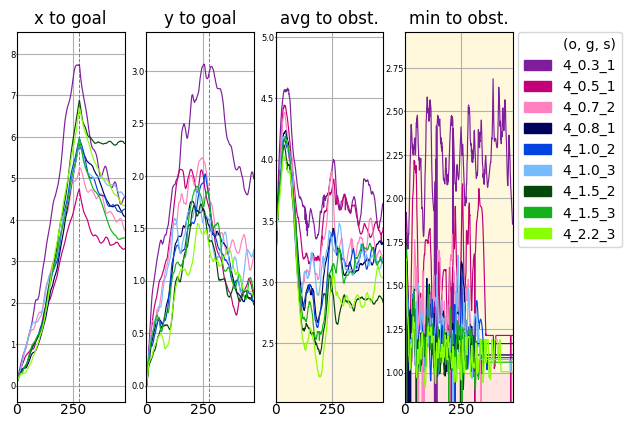

In [5]:
import graphical_evaluation as ge
from graphical_evaluation import read_data, plot_data_dict
import matplotlib.pyplot as plt

depth = 1

ge.MAX_INDEX = int(max_index)
ge.DT = dt

data_dict = read_data(f"./data/{dir_name}", depth)
plot_data_dict(data_dict, depth, fig_name=dir_name, color_dict={})
plt.show()